In [1]:
import numpy as np
import xarray as xr
import cf_xarray as cfxr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from scipy.interpolate import griddata
import regionmask
import pandas as pd
import seaborn as sns
from pydmd import DMD, BOPDMD
from pydmd.plotter import plot_eigs, plot_summary
from pydmd.preprocessing import hankel_preprocessing
from sklearn.preprocessing import StandardScaler
import math
import plotly.express as px
import geopandas as gpd
from shapely.geometry import Point
from shapely.geometry import Polygon
from scipy.spatial import distance_matrix
import plotly.graph_objects as go
import kaleido
import requests
from io import StringIO
import pwlf
from scipy.stats import skew

In [10]:

fN = ("Datos\Complete_TAVG_Daily_EqualArea.nc") 

ds = xr.open_dataset(fN)
years_approx = np.floor(ds['time'])
#temp = ds['temperature'].groupby(years_approx).mean('time')
longitude = ds.variables['longitude'][:]  
latitude = ds.variables['latitude'][:]
time = ds.variables['date_number'][:]
land_mask = ds.variables['land_mask'][:]
temperature = ds.variables['temperature'][:]
climatology = ds.variables['climatology'][:]

In [12]:
ds = xr.open_dataset(fN)

# Ver el contenido del dataset
print(ds)


<xarray.Dataset> Size: 1GB
Dimensions:      (map_points: 5498, time: 52077, day_number: 365)
Coordinates:
    longitude    (map_points) float32 22kB ...
    latitude     (map_points) float32 22kB ...
Dimensions without coordinates: map_points, time, day_number
Data variables:
    date_number  (time) float64 417kB ...
    year         (time) float64 417kB ...
    month        (time) float64 417kB ...
    day          (time) float64 417kB ...
    day_of_year  (time) float64 417kB ...
    land_mask    (map_points) float64 44kB ...
    temperature  (time, map_points) float32 1GB ...
    climatology  (day_number, map_points) float32 8MB ...
Attributes:
    Conventions:     Berkeley Earth Internal Convention (based on CF-1.5)
    title:           Native Format Berkeley Earth Surface Temperature Anomaly...
    history:         07-Sep-2022 00:28:01
    institution:     Berkeley Earth Surface Temperature Project
    source_history:  06-Sep-2022 15:50:29
    comment:         This file contains B

In [ ]:

temperature_mean = temperature_df.mean(axis=1)
# Calcular la media móvil de 12 años y la desviación estándar móvil
moving_average = temperature_mean.rolling(window=12).mean()
moving_std = temperature_mean.std()

# Calcular el intervalo de confianza del 95% para la media móvil
confidence_interval_upper = moving_average + 1.96 * moving_std / np.sqrt(12)
confidence_interval_lower = moving_average - 1.96 * moving_std / np.sqrt(12)

# Crear la gráfica base con la temperatura media
fig = go.Figure()

# Añadir la media móvil de 12 años
fig.add_trace(go.Scatter(x=temperature_mean.index, y=moving_average, mode='lines', name='Media Móvil 12 Años',line=dict(color='red')))

# Añadir el intervalo de confianza como una región sombreada
fig.add_trace(go.Scatter(x=temperature_mean.index.tolist() + temperature_mean.index.tolist()[::-1],
                         y=confidence_interval_upper.tolist() + confidence_interval_lower.tolist()[::-1],
                         fill='toself', fillcolor='rgba(0,100,80,0.2)',
                         line=dict(color='rgba(255,255,255,0)'),
                         name='Intervalo de Confianza 95%'))

# Añadir la serie de temperatura promedio original para referencia
fig.add_trace(go.Scatter(x=temperature_mean.index, y=temperature_mean, mode='lines', name='Temperatura Promedio', line=dict(color='gray', dash='dash')))

# Actualizar el layout de la gráfica
fig.update_layout(title='Temperatura Promedio y Media Móvil de 12 Años con Intervalo de Confianza',
                  xaxis_title='Tiempo', yaxis_title='Temperatura Promedio (°C)',
                  legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))

# Mostrar la gráfica
fig.show()


In [32]:
import xarray as xr
import numpy as np
import plotly.graph_objs as go
import pandas as pd

# Cargar el archivo NetCDF
fN = "Datos/Complete_TAVG_Daily_EqualArea.nc"
ds = xr.open_dataset(fN)

# Calcular la temperatura promedio y la desviación estándar por día a lo largo de todos los puntos geográficos
daily_avg_temp = ds['temperature'].mean(dim='map_points').values
daily_std_temp = ds['temperature'].std(dim='map_points').values

# Extraer las dimensiones de tiempo (años, meses y días)
years = ds['year'].values
months = ds['month'].values
days = ds['day'].values

# Crear un DataFrame para juntar los días y fechas correspondientes
df = pd.DataFrame({
    'year': years,
    'month': months,
    'day': days,
    'temperature': daily_avg_temp,
    'std_dev': daily_std_temp
})

# Crear una columna con las fechas (año-mes-día)
df['date'] = pd.to_datetime(df[['year', 'month', 'day']])

# Crear trazas para la temperatura con intervalo de confianza
temp_trace = go.Scatter(
    x=df['date'],  # Usamos la fecha completa para el eje X
    y=df['temperature'],
    mode='lines',
    name='Temperatura Promedio',
    line=dict(color='blue')
)

# Rellenar el intervalo de confianza de la temperatura (una desviación estándar)
temp_confidence_interval = go.Scatter(
    x=np.concatenate([df['date'], df['date'][::-1]]),  # Usamos las fechas para el eje X
    y=np.concatenate([df['temperature'] + df['std_dev'], (df['temperature'] - df['std_dev'])[::-1]]),  # Límites superior e inferior
    fill='toself',
    fillcolor='rgba(0, 0, 255, 0.2)',  # Color azul oscuro con transparencia
    line=dict(color='rgba(255, 255, 255, 0)'),  # Sin borde
    showlegend=False,
    name='Intervalo de Confianza'
)

# Crear la figura y agregar las trazas
fig = go.Figure(data=[temp_trace, temp_confidence_interval])

# Agregar títulos y etiquetas
fig.update_layout(
    title="Promedio Diario de Temperatura con Intervalo de Confianza",
    xaxis_title="Fecha (Años)",
    yaxis_title="Temperatura (°C)",
    xaxis=dict(
        tickformat='%Y',  # Mostrar solo el año en el eje X
        tickmode='linear',  # Asegura que las marcas de los años aparezcan de manera continua
    ),
    legend=dict(x=0.02, y=0.98),
    hovermode="x"
)

# Mostrar la figura
fig.show()


C:\Users\danie\AppData\Local\Temp\ipykernel_20896\3380018610.py:37: MatplotlibDeprecationWarning:

The 'use_line_collection' parameter of stem() was deprecated in Matplotlib 3.6 and will be removed two minor releases later. If any parameter follows 'use_line_collection', they should be passed as keyword, not positionally.



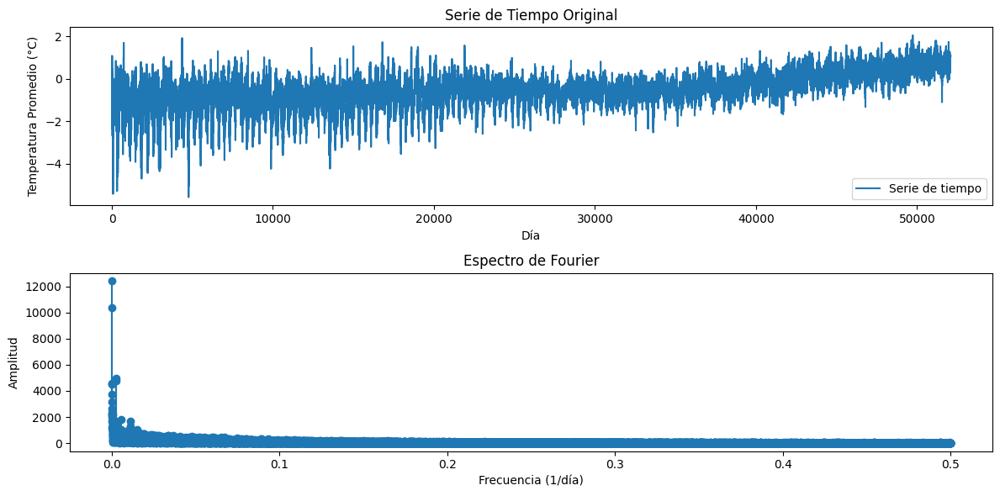

In [21]:
import xarray as xr
import numpy as np
import plotly.graph_objs as go
import matplotlib.pyplot as plt

# Cargar el archivo NetCDF
fN = "Datos/Complete_TAVG_Daily_EqualArea.nc"
ds = xr.open_dataset(fN)

# Calcular la temperatura promedio por día a lo largo de todos los puntos geográficos
temperature_mean = ds['temperature'].mean(dim='map_points')

# Transformar el DataArray a un numpy array para realizar la Transformada de Fourier
temperature_mean_np = temperature_mean.values

# Calcular la Transformada de Fourier Discreta
fourier_transform = np.fft.fft(temperature_mean_np)
frequencies = np.fft.fftfreq(len(temperature_mean_np), d=1)  # Se asume paso de tiempo 1 día

# Obtener las amplitudes y filtrar frecuencias positivas
amplitudes = np.abs(fourier_transform)
positive_frequencies = frequencies > 0

# Graficar la serie de tiempo original y su espectro de Fourier
plt.figure(figsize=(12, 6))

# Gráfico de la serie de tiempo original
plt.subplot(2, 1, 1)
plt.plot(temperature_mean_np, label="Serie de tiempo")
plt.title("Serie de Tiempo Original")
plt.xlabel("Día")
plt.ylabel("Temperatura Promedio (°C)")
plt.legend()

# Graficar el espectro de Fourier
plt.subplot(2, 1, 2)
plt.stem(frequencies[positive_frequencies], amplitudes[positive_frequencies], basefmt=" ", use_line_collection=True)
plt.title("Espectro de Fourier")
plt.xlabel("Frecuencia (1/día)")
plt.ylabel("Amplitud")
plt.tight_layout()

# Mostrar los gráficos
plt.show()


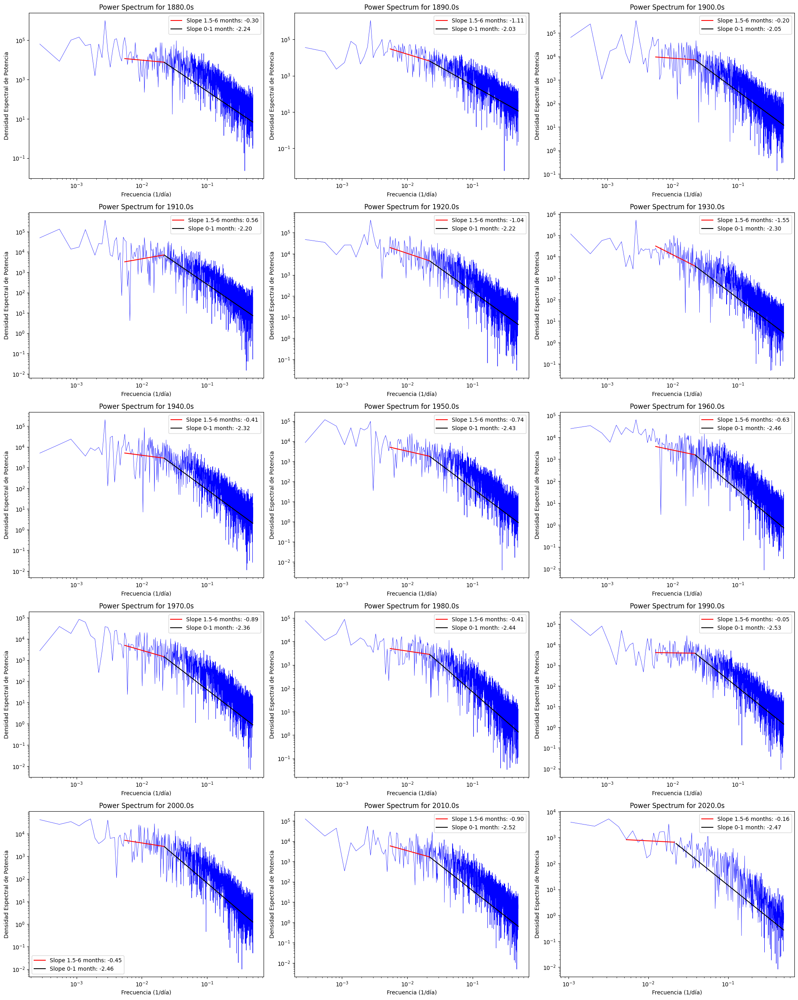

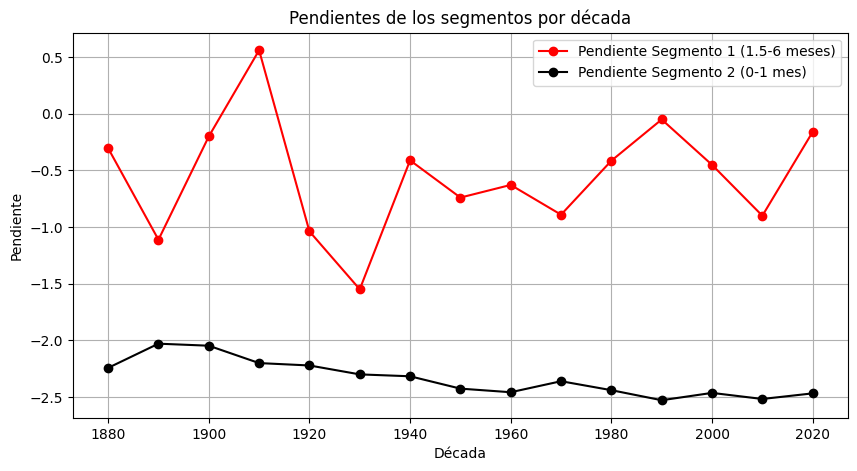

In [28]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# Cargar el archivo NetCDF
fN = "Datos/Complete_TAVG_Daily_EqualArea.nc"
ds = xr.open_dataset(fN)

# Extraer el campo 'year' y 'temperature' de los datos
years = ds['year'].values
temperature_mean = ds['temperature'].mean(dim='map_points').values

# Crear un DataFrame con los datos de temperatura promedio diaria
df = pd.DataFrame({
    'Year': years,  # Utilizamos directamente el campo 'year' del dataset
    'Anomaly': temperature_mean
})

# Crear columna de década
df['Decade'] = (df['Year'] // 10) * 10

# Número de gráficas por fila
plots_per_row = 3

# Calcular el número total de décadas y filas necesarias
unique_decades = df['Decade'].unique()
total_rows = math.ceil(len(unique_decades) / plots_per_row)

# Listas para almacenar las pendientes de cada segmento por década
slopes_segment_1 = []
slopes_segment_2 = []

# Crear una figura para acomodar todas las subgráficas
plt.figure(figsize=(20, total_rows * 5))

for i, decade in enumerate(unique_decades, start=1):
    ax = plt.subplot(total_rows, plots_per_row, i)
    decade_data = df[df['Decade'] == decade]['Anomaly'].values
    
    # FFT y frecuencias
    fft_result = np.fft.fft(decade_data)
    frequencies = np.fft.fftfreq(len(decade_data), d=1)
    power_spectrum = np.abs(fft_result) ** 2
    
    # Graficar el espectro de potencia
    ax.loglog(frequencies[frequencies > 0], power_spectrum[frequencies > 0], 'b-', linewidth=0.5)

    # Analizar rangos de frecuencia
    # 1.5 to 6 months (45 to 180 days)
    freq_45_days = 1 / 45
    freq_180_days = 1 / 180
    index_45_days = np.argmin(np.abs(frequencies - freq_45_days))
    index_180_days = np.argmin(np.abs(frequencies - freq_180_days))
    
    if index_45_days > index_180_days:
        freq_range_1 = frequencies[index_180_days:index_45_days]
        power_range_1 = power_spectrum[index_180_days:index_45_days]
        log_freq_1 = np.log10(freq_range_1)
        log_power_1 = np.log10(power_range_1)
        slope_1, intercept_1 = np.polyfit(log_freq_1, log_power_1, 1)

        # Guardar la pendiente del primer segmento
        slopes_segment_1.append(slope_1)

        ax.loglog(freq_range_1, 10**(intercept_1 + slope_1 * log_freq_1), 'r-', label=f'Slope 1.5-6 months: {slope_1:.2f}')
    
    # Obtener el punto final de la primera recta
    last_freq = freq_range_1[-1]
    last_power = 10**(intercept_1 + slope_1 * np.log10(last_freq))
    
    # 0 to 1 month (1 to 45 days)
    freq_1_day = 1 / 1
    index_1_day = np.argmin(np.abs(frequencies - freq_1_day))
    
    if index_1_day > index_45_days:
        freq_range_2 = frequencies[index_45_days:index_1_day]
        power_range_2 = power_spectrum[index_45_days:index_1_day]
        log_freq_2 = np.log10(freq_range_2)
        log_power_2 = np.log10(power_range_2)
        
        # Ajustar la segunda recta para que comience en el punto final de la primera
        slope_2, _ = np.polyfit(log_freq_2, log_power_2, 1)
        
        # Calcular el nuevo intercepto para que la segunda recta inicie donde terminó la primera
        intercept_2 = np.log10(last_power) - slope_2 * np.log10(last_freq)
        
        # Guardar la pendiente del segundo segmento
        slopes_segment_2.append(slope_2)
        
        ax.loglog(freq_range_2, 10**(intercept_2 + slope_2 * log_freq_2), 'k-', label=f'Slope 0-1 month: {slope_2:.2f}')

    # Configurar títulos y etiquetas
    ax.set_title(f'Power Spectrum for {decade}s')
    ax.set_xlabel('Frecuencia (1/día)')
    ax.set_ylabel('Densidad Espectral de Potencia')
    ax.legend()

# Ajustar el diseño de las subgráficas
plt.tight_layout()
plt.show()

# Crear una gráfica de las pendientes de los segmentos por década
plt.figure(figsize=(10, 5))
plt.plot(unique_decades, slopes_segment_1, 'o-', color='r', label='Pendiente Segmento 1 (1.5-6 meses)')
plt.plot(unique_decades, slopes_segment_2, 'o-', color='k', label='Pendiente Segmento 2 (0-1 mes)')
plt.xlabel('Década')
plt.ylabel('Pendiente')
plt.title('Pendientes de los segmentos por década')
plt.legend()
plt.grid(True)
plt.show()
